<a href="https://colab.research.google.com/github/junduk123/Machine-Learning-Task/blob/main/Task11Classification_dummy_dat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
# Langkah 1: Membuat data dummy dengan 5 fitur dan 2000 sampel
# Fitur: 5, Sampel: 2000, Kelas: 3 (klasifikasi multi-kelas)
np.random.seed(42)  # Seed untuk reproduksibilitas
X = np.random.rand(2000, 5)  # Nilai acak antara 0 dan 1
y = np.random.randint(0, 3, size=(2000,))  # Kelas acak (0, 1, 2)

In [ ]:
# Konversi ke DataFrame pandas untuk analisis yang lebih mudah
data = pd.DataFrame(X, columns=[f'Feature_{i+1}' for i in range(5)])
data['Target'] = y

In [ ]:
# Langkah 2: Melakukan Exploratory Data Analysis (EDA)
print("Dataset Head:\n", data.head())
print("\nStatistik Ringkasan:\n", data.describe())
print("\nDistribusi Kelas:\n", data['Target'].value_counts())

Dataset Head:
    Feature_1  Feature_2  Feature_3  Feature_4  Feature_5  Target
0   0.374540   0.950714   0.731994   0.598658   0.156019       2
1   0.155995   0.058084   0.866176   0.601115   0.708073       1
2   0.020584   0.969910   0.832443   0.212339   0.181825       0
3   0.183405   0.304242   0.524756   0.431945   0.291229       1
4   0.611853   0.139494   0.292145   0.366362   0.456070       2

Statistik Ringkasan:
          Feature_1    Feature_2    Feature_3    Feature_4    Feature_5  \
count  2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
mean      0.490725     0.496531     0.491653     0.500635     0.491254   
std       0.288225     0.289573     0.289703     0.284092     0.286679   
min       0.000227     0.000031     0.000012     0.000402     0.000135   
25%       0.247014     0.238295     0.241191     0.264425     0.241830   
50%       0.481689     0.500833     0.492148     0.496567     0.491176   
75%       0.742502     0.741433     0.741630     0.741

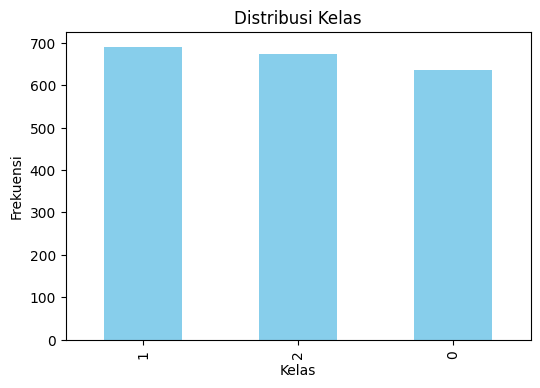

In [ ]:
# Visualisasi distribusi kelas
plt.figure(figsize=(6, 4))
data['Target'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribusi Kelas')
plt.xlabel('Kelas')
plt.ylabel('Frekuensi')
plt.show()


In [ ]:
# Langkah 3: Preprocessing Data
# Membagi dataset menjadi data pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standarisasi fitur
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Konversi data ke tensor PyTorch
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Membuat DataLoader untuk pemrosesan batch
batch_size = 32  # Dapat disesuaikan
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [ ]:
# Langkah 4: Mendefinisikan kelas model MLP
class MLPModel(nn.Module):
    def __init__(self, input_size, hidden_layers, activation_fn):
        super(MLPModel, self).__init__()
        layers = []

        # Lapisan input
        prev_size = input_size

        # Menambahkan lapisan tersembunyi secara dinamis
        for layer_size in hidden_layers:
            layers.append(nn.Linear(prev_size, layer_size))
            if activation_fn == 'relu':
                layers.append(nn.ReLU())
            elif activation_fn == 'sigmoid':
                layers.append(nn.Sigmoid())
            elif activation_fn == 'tanh':
                layers.append(nn.Tanh())
            elif activation_fn == 'softmax':
                layers.append(nn.Softmax(dim=1))
            elif activation_fn == 'linear':
                pass  # Tidak ada aktivasi untuk fungsi linear
            prev_size = layer_size

        # Lapisan output
        layers.append(nn.Linear(prev_size, 3))  # 3 kelas untuk klasifikasi
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


In [ ]:
# Langkah 5: Melatih model
# Hyperparameter
hidden_layers_list = [[4], [8], [16], [4, 8], [8, 16], [16, 32], [4, 8, 16]]
activation_functions = ['relu', 'sigmoid', 'tanh', 'softmax', 'linear']
epochs_list = [1, 10, 25, 50, 100, 250]
learning_rates = [10, 1, 0.1, 0.001, 0.0001]
batch_sizes = [16, 32, 64, 128]

results = []

In [ ]:
def train_model(hidden_layers, activation_fn, epochs, lr, batch_size):
    model = MLPModel(input_size=5, hidden_layers=hidden_layers, activation_fn=activation_fn)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for batch_X, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}")

    # Evaluasi model
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for batch_X, batch_y in test_loader:
            outputs = model(batch_X)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.numpy())
            all_labels.extend(batch_y.numpy())

    acc = accuracy_score(all_labels, all_preds)
    results.append({
        'hidden_layers': hidden_layers,
        'activation_fn': activation_fn,
        'epochs': epochs,
        'lr': lr,
        'batch_size': batch_size,
        'accuracy': acc
    })
    return acc

# Melatih model dengan berbagai hyperparameter
for hidden_layers in hidden_layers_list:
    for activation_fn in activation_functions:
        for epochs in epochs_list:
            for lr in learning_rates:
                for batch_size in batch_sizes:
                    print(f"Melatih dengan hidden_layers={hidden_layers}, activation_fn={activation_fn}, epochs={epochs}, lr={lr}, batch_size={batch_size}")
                    acc = train_model(hidden_layers, activation_fn, epochs, lr, batch_size)
                    print(f"Akurasi: {acc}\n")

# Langkah 6: Analisis hasil dan visualisasi
results_df = pd.DataFrame(results)

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=10, batch_size=16
Epoch [1/1], Loss: 15.4992
Akurasi: 0.3575

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=10, batch_size=32
Epoch [1/1], Loss: 12.7737
Akurasi: 0.325

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=10, batch_size=64
Epoch [1/1], Loss: 16.2942
Akurasi: 0.3175

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=10, batch_size=128
Epoch [1/1], Loss: 26.6476
Akurasi: 0.36

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=1, batch_size=16
Epoch [1/1], Loss: 1.3392
Akurasi: 0.325

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=1, batch_size=32
Epoch [1/1], Loss: 1.3201
Akurasi: 0.325

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=1, batch_size=64
Epoch [1/1], Loss: 1.3791
Akurasi: 0.365

Melatih dengan hidden_layers=[4], activation_fn=relu, epochs=1, lr=1, batch_size=128
Epoch [1/1], Loss: 1.25

In [ ]:
# Menampilkan konfigurasi dengan performa terbaik
top_results = results_df.sort_values(by='accuracy', ascending=False).head(10)
print("\n10 Konfigurasi Terbaik:\n", top_results)



10 Konfigurasi Terbaik:
      hidden_layers activation_fn  epochs       lr  batch_size  accuracy
881            [8]          tanh      25  10.0000          32    0.4075
330            [4]          tanh     100   0.1000          64    0.4075
2875       [8, 16]       softmax     250   0.0010         128    0.4075
2132        [4, 8]          tanh     100   0.0010          16    0.4050
1234          [16]          relu      10   0.0010          64    0.4025
2725       [8, 16]          tanh     100   1.0000          32    0.4000
1397          [16]       sigmoid      50   0.0001          32    0.4000
473            [4]       softmax     250   0.0010          32    0.3975
3037      [16, 32]          relu      10   0.0001          32    0.3975
4117    [4, 8, 16]        linear      10   0.0001          32    0.3975


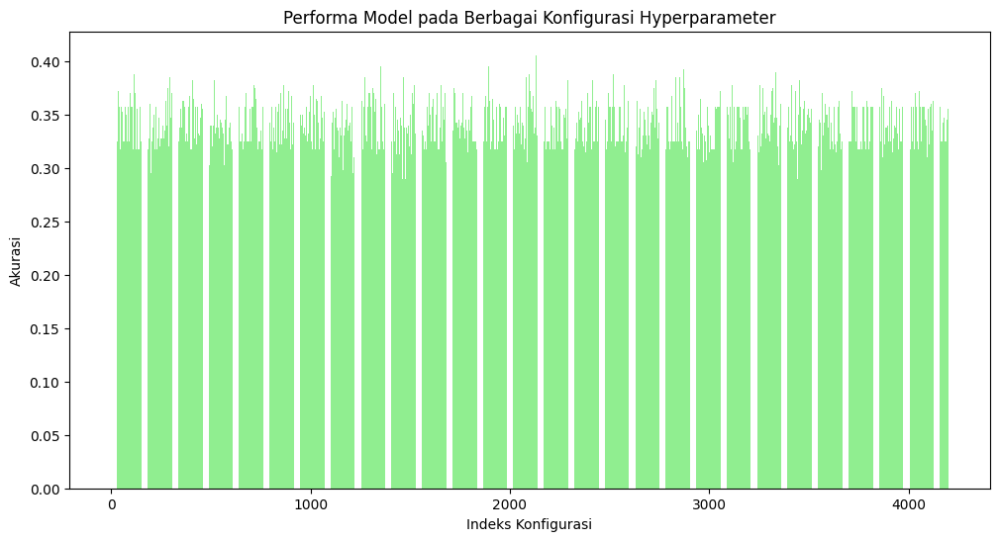

In [ ]:
# Visualisasi hasil
plt.figure(figsize=(12, 6))
plt.bar(range(len(results_df)), results_df['accuracy'], color='lightgreen')
plt.title('Performa Model pada Berbagai Konfigurasi Hyperparameter')
plt.xlabel('Indeks Konfigurasi')
plt.ylabel('Akurasi')
plt.show()


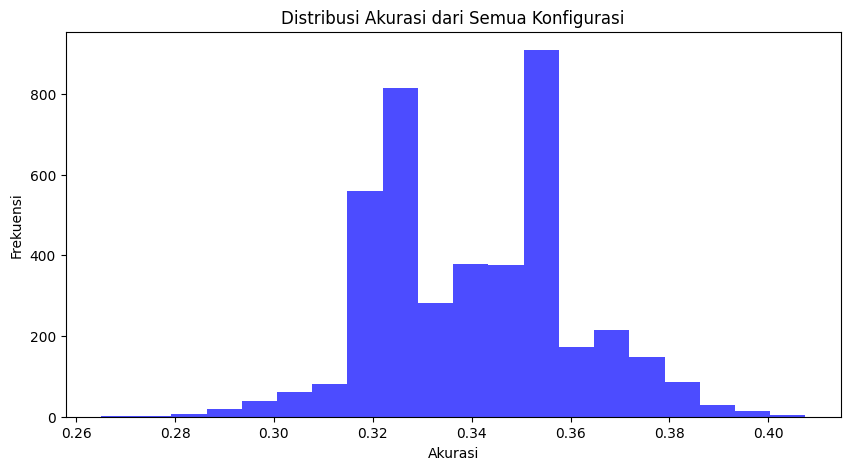

In [ ]:
# Visualisasi distribusi akurasi
plt.figure(figsize=(10, 5))
plt.hist(results_df['accuracy'], bins=20, color='blue', alpha=0.7)
plt.title('Distribusi Akurasi dari Semua Konfigurasi')
plt.xlabel('Akurasi')
plt.ylabel('Frekuensi')
plt.show()

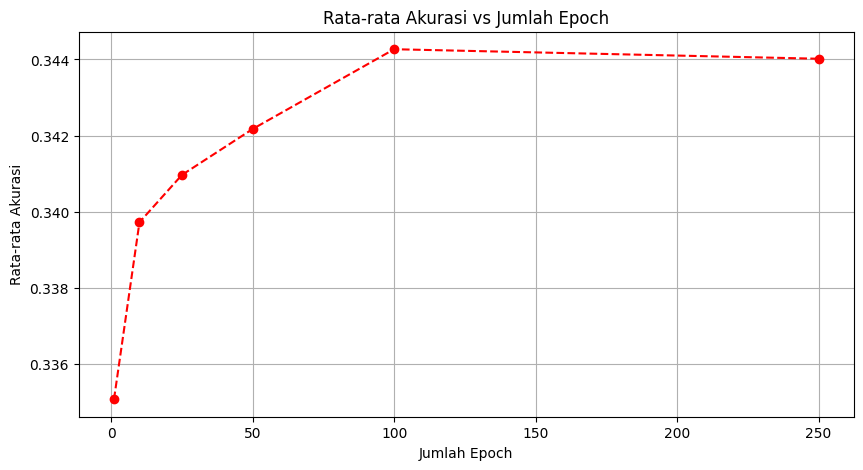

In [ ]:
# Visualisasi hubungan antara jumlah epoch dan akurasi rata-rata
average_accuracy_per_epoch = results_df.groupby('epochs')['accuracy'].mean()
plt.figure(figsize=(10, 5))
plt.plot(average_accuracy_per_epoch, marker='o', linestyle='--', color='r')
plt.title('Rata-rata Akurasi vs Jumlah Epoch')
plt.xlabel('Jumlah Epoch')
plt.ylabel('Rata-rata Akurasi')
plt.grid()
plt.show()